<a href="https://colab.research.google.com/github/a-thansen/SDAV/blob/main/Explainer_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## The Wine Value Finder - Explainer Notebook

### Motivation

Our dataset is the "Updated Wine Enthusiast Reviews" scraped from Kaggle. It contains roughly 130,000 professional wine reviews. Each observation represents a single wine tasting and includes 14 variables such as the vintage, the geographic origin (country, province, region), the grape variety, the price, the points (rating on an 80-100 scale), and a text description written by a sommelier.

We chose this dataset because the wine market is notoriously opaque for the average consumer. Most shoppers rely on price tags or label aesthetics as proxies for quality. This dataset is perfect for our project because it combines numerical data (price/points), geospatial data (origins), and unstructured text data (wine description), allowing us to utilize a wide variety of the data science and NLP tools to solve a real-world consumer problem.

Our goal is to give you a deep look at how value actually works across thousands of different wines before we suggest a single bottle. You will explore how different regions and flavor profiles stack up against their price tags so you can spot the winners yourself. Once you have a feel for the landscape, our AI Sommelier will help you find the exact match for your next meal. It is about moving from the big patterns of the market to the perfect bottle for your table.

## Data Processing



### Dataset Variables

To understand our analysis, it is important to define the features available in our dataset:

*   **country**: The country of origin for the wine.
*   **description**: A professional sommelier's sensory review of the wine.
*   **designation**: The specific vineyard or sub-brand within a winery.
*   **points**: The rating awarded by Wine Enthusiast on a scale of 80-100.
*   **price**: The cost per 750ml bottle (USD).
*   **province**: The state or province of origin.
*   **region_1**: The specific wine-growing area (e.g., Napa Valley).
*   **region_2**: A broader region (if applicable, e.g., Central Coast).
*   **taster_name**: The name of the professional who reviewed the wine.
*   **taster_twitter_handle**: The social media contact for the reviewer.
*   **title**: The full name of the wine including the vintage.
*   **variety**: The specific type of grape (e.g., Pinot Noir, Chardonnay).
*   **winery**: The producer of the wine.


### Data Cleaning
To prepare the Kaggle Wine Enthusiast dataset for a clean and reliable analysis, we performed the following steps:

1.  **Dropping Critical Missing Values:** We removed all observations missing 'price', 'points', or 'country', as these are essential for calculating quality-to-price ratios.
2.  **Deduplication:** We identified and removed duplicate reviews based on the 'description' and 'title' to ensure specific marketing campaigns or re-tastings didn't skew our statistics.
3.  **Numeric Casting:** We converted the 'vintage' and 'price' columns into numeric types, using coercion to handle non-standard entries as missing values.
4.  **Vintage Outlier Filtering:** We restricted the dataset to wines with a vintage between 1900 and 2025, removing erroneous entries (likely typos in years) that fall outside realistic ranges (with one observation of a vintage wine from allegedly 2065).
5.  **Metadata Extraction:** We calculated the physical file size and dataset dimensions to provide a summary of the processed scale.
6.  **Visualization Clipping:** For exploratory plotting, we created a specific subset (`df_viz`) limited to wines priced at or below &#36;175. This removes extreme luxury outliers (up to &#36;3,400) that would compress the scale of our charts, while still retaining 99% of the data.

Using Colab cache for faster access to the 'updated-wine-enthusiast-review' dataset.
Original dataset size: 81,115 rows
Cleaned dataset size: 76,464 rows
df_clean is ready for analysis!
Wines under $175 represent 99.0% of the cleaned dataset.


,Metric,Value
0,File size,41.18 MB
1,Rows,"76,463"
2,Variables,15
3,Unique Countries,43
4,Unique Grape Varieties,692
5,Wineries,"12,200"
6,Vintage range (cleaned),1904 to 2019
7,Vintage outliers removed,1
8,Points range,80 to 100
9,Price range,$4.00 to $3400.00


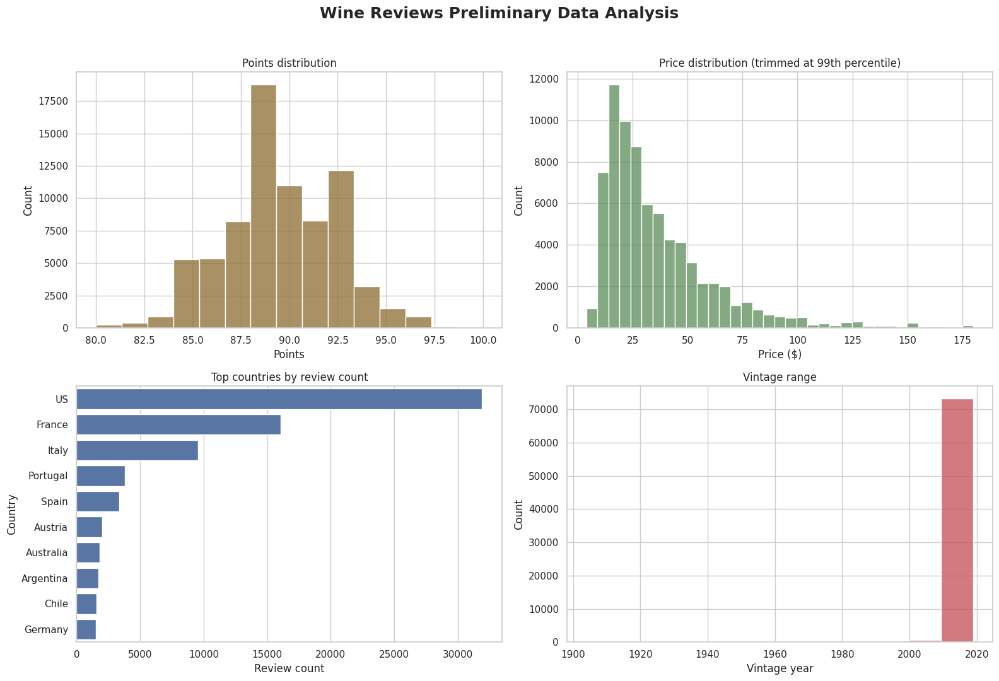

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import kagglehub
import os

# Download latest version of the dataset
path = kagglehub.dataset_download("manyregression/updated-wine-enthusiast-review")

# Find the csv file in the downloaded directory
csv_file = [f for f in os.listdir(path) if f.endswith('.csv')][0]
df = pd.read_csv(os.path.join(path, csv_file), index_col=0)

sns.set_theme(style="whitegrid")

# ==========================================
# DATA CLEANING
# ==========================================

# 1. Dropping Critical Missing Values:
# We remove all observations missing 'price', 'points', or 'country'
df = df.reset_index()
df_clean = df.dropna(subset=['price', 'points', 'country'])

# 2. Deduplication:
# We identify and remove duplicate reviews based on 'description' and 'title'
df_clean = df_clean.drop_duplicates(subset=['description', 'title'])

# Reset the index to keep the dataframe tidy after dropping so many rows
df_clean = df_clean.reset_index(drop=True)

print(f"Original dataset size: {df.shape[0]:,} rows")
print(f"Cleaned dataset size: {df_clean.shape[0]:,} rows")
print("df_clean is ready for analysis!")

# Create a copy for specific analysis
analysis_df = df_clean.copy()

# Convert vintage and price to numeric, coercing errors to NaN
analysis_df['vintage'] = pd.to_numeric(analysis_df['vintage'], errors='coerce')
analysis_df['price'] = pd.to_numeric(analysis_df['price'], errors='coerce')

# Filter vintage outliers (1500-2025)
vintage_values = analysis_df['vintage'].dropna().astype(int)
valid_vintage = vintage_values[vintage_values.between(1500, 2025)]
vintage_outlier_count = len(vintage_values) - len(valid_vintage)

# Apply the vintage filter to the analysis dataframe
analysis_df = analysis_df[analysis_df['vintage'].isna() | analysis_df['vintage'].between(1900, 2025)]

# Calculate File Size (using the path from the first cell)
file_size_mb = os.path.getsize(os.path.join(path, csv_file)) / (1024 ** 2)

# Generate Summary DataFrame
row_count, column_count = analysis_df.shape
price_values = analysis_df['price'].dropna()

# Filtering for visualization (Wines under $175)
df_viz = analysis_df[analysis_df['price'] <= 175]

print(f"Wines under $175 represent {len(df_viz)/len(analysis_df)*100:.1f}% of the cleaned dataset.")

summary = pd.DataFrame([
    ['File size', f'{file_size_mb:.2f} MB'],
    ['Rows', f'{row_count:,}'],
    ['Variables', f'{column_count}'],
    ['Unique Countries', f"{df_clean['country'].nunique():,}"],
    ['Unique Grape Varieties', f"{df_clean['variety'].nunique():,}"],
    ['Wineries', f"{analysis_df['winery'].nunique():,}"],
    ['Vintage range (cleaned)', f'{int(valid_vintage.min())} to {int(valid_vintage.max())}'],
    ['Vintage outliers removed', f'{vintage_outlier_count:,}'],
    ['Points range', f"{analysis_df['points'].min()} to {analysis_df['points'].max()}"],
    ['Price range', f"${price_values.min():.2f} to ${price_values.max():.2f}"],
], columns=['Metric', 'Value'])

display(summary)

# ==========================================
# VISUALIZATION 1: The 2x2 Summary Grid
# ==========================================
fig, axes = plt.subplots(2, 2, figsize=(16, 11))
fig.suptitle('Wine Reviews Preliminary Data Analysis', fontsize=18, fontweight='bold')

sns.histplot(analysis_df['points'], bins=15, color='#8c6d31', ax=axes[0, 0])
axes[0, 0].set_title('Points distribution')
axes[0, 0].set_xlabel('Points')
axes[0, 0].set_ylabel('Count')

price_cap = price_values.quantile(0.99)
sns.histplot(price_values[price_values <= price_cap], bins=35, color='#5b8c5a', ax=axes[0, 1])
axes[0, 1].set_title('Price distribution (trimmed at 99th percentile)')
axes[0, 1].set_xlabel('Price ($)')
axes[0, 1].set_ylabel('Count')

country_counts = analysis_df['country'].value_counts().head(10)
sns.barplot(x=country_counts.values, y=country_counts.index, color='#4c72b0', ax=axes[1, 0])
axes[1, 0].set_title('Top countries by review count')
axes[1, 0].set_xlabel('Review count')
axes[1, 0].set_ylabel('Country')

sns.histplot(valid_vintage, bins=12, color='#c44e52', ax=axes[1, 1])
axes[1, 1].set_title('Vintage range')
axes[1, 1].set_xlabel('Vintage year')
axes[1, 1].set_ylabel('Count')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### Filtering vs. Transformation
One of the biggest challenges with wine data is the Price Tail. While most wines are between 10 and 50 dollars, a few prestige bottles can cost thousands, which would completely break a standard average. To solve this, we took a two-step approach:


1. **Strategic Capping**: Instead of using complex math to "shrink" high prices, we focused our analysis on the "real world" market by limiting our dataset to wines priced under &#36;175. This also removed extreme outliers that would have skewed the Z-score mean.
2. **Raw Z-Score Normalization**: We then calculated how many standard deviations each bottle sat away from the average for both quality and price.$$TVI = Z_{points} - Z_{price}$$ By using the raw price Z-score rather than a log-transformed one, the TVI is extremely sensitive to price. We wanted the model to be highly sensitive to price for the average consumer. By capping the data at $175 and using raw Z-scores, we ensure that even a small increase in price must be justified by a significant jump in quality to maintain a high Value Index.

While we used a Global Z-score (calculating the mean across the entire 76,000-bottle set), this still mitigates regional bias by exposing the 'Prestige Tax.' Because world-renowned regions sit significantly above the global price mean, their $Z_{price}$ acts as a heavy anchor on their True Value Index. This mathematically creates space for 'Value Titan' regions—where quality is high but price remains near or below the global mean—to dominate the rankings.

In [ ]:
import scipy.stats as stats

# 1. Calculate Z-scores for points and price
# We use df_viz (wines under $175) to prevent extreme price outliers from skewing the mean
df_clean['z_points'] = stats.zscore(df_clean['points'])
df_clean['z_price'] = stats.zscore(df_clean['price'])

# 2. The True Value Formula: (Standardized Quality) - (Standardized Cost)
df_clean['True Value Index'] = df_clean['z_points'] - df_clean['z_price']

# 3. Let's find the absolute best mathematical value in the dataset
top_values = df_clean.sort_values(by='True Value Index', ascending=False).head(5)

print("The Top 5 'True Value' Wines (Z-Score Normalized):")
display(top_values[['title', 'variety', 'price', 'points', 'True Value Index']])

The Top 5 'True Value' Wines (Z-Score Normalized):


,title,variety,price,points,True Value Index
49689,Patricia Green Cellars 2016 Estate Vineyard Bonshaw Block Pinot Noir (Ribbon Ridge),Pinot Noir,60.0,100,3.252629
64766,Sattlerhof 2013 Trockenbeerenauslese Sauvignon Blanc (Südsteiermark),Sauvignon Blanc,65.0,100,3.148849
41113,Sandeman 2017 Quinta do Seixo (Port),Port,70.0,100,3.045068
24280,Williams Selyem 2017 Pinot Noir (Sonoma County),Pinot Noir,39.0,98,2.997543
66831,Terre Rouge 2016 High Slopes Syrah (Sierra Foothills),Syrah,40.0,98,2.976787


## Data Analysis

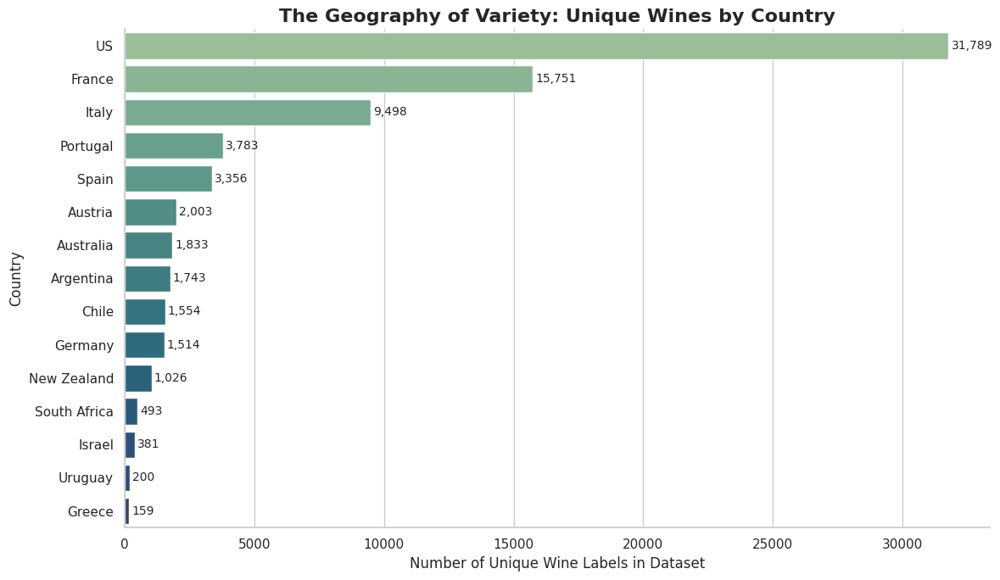


Diversity Concentration:
There are 75,926 unique wines in the cleaned dataset.
The Top 3 countries (US, France, Italy) account for 75.1% of all unique wines available to our Sommelier.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by country and count the number of UNIQUE titles
country_variety = df_clean.groupby('country')['title'].nunique().reset_index()

# Sort to find the countries with the most diverse offerings
top_countries_variety = country_variety.sort_values(by='title', ascending=False).head(15)

# ==========================================
# VISUALIZATION 1: The Geography of Variety
# ==========================================
plt.figure(figsize=(12, 7))

# Create a horizontal bar chart
sns.barplot(
    data=top_countries_variety,
    x='title',
    y='country',
    palette='crest',
    hue='country',
    legend=False # Set legend=False to avoid showing a redundant legend
)

plt.title('The Geography of Variety: Unique Wines by Country', fontsize=16, fontweight='bold')
plt.xlabel('Number of Unique Wine Labels in Dataset', fontsize=12)
plt.ylabel('Country', fontsize=12)

# Add the exact count text to the end of each bar for easy reading
for index, value in enumerate(top_countries_variety['title']):
    plt.text(value + 100, index, f"{value:,}", va='center', fontsize=10)

sns.despine()
plt.tight_layout()
plt.show()

# 3. Market Concentration Calculation
total_unique_wines = df_clean['title'].nunique()
top_3_unique = top_countries_variety['title'].head(3).sum()
concentration_pct = (top_3_unique / total_unique_wines) * 100

print(f"\nDiversity Concentration:")
print(f"There are {total_unique_wines:,} unique wines in the cleaned dataset.")
print(f"The Top 3 countries (US, France, Italy) account for {concentration_pct:.1f}% of all unique wines available to our Sommelier.")

### Dataset Provenance and Sampling Bias

Before proceeding into modeling, it is essential to critically evaluate the provenance of our data. Our dataset is sourced from Wine Enthusiast, a prominent publication based in New York. While this provides us with a high-fidelity collection of professional reviews, it introduces a significant geographic sampling bias. As seen in the "Geography of Variety" chart, the United States accounts for nearly 32,000 unique wine labels, dwarfing every other nation in the dataset. This is a classic example of "Home Field Advantage" in data science: because the publication is American, its editorial focus is naturally tilted toward domestic vineyards and the wines most readily available in the US market.

This imbalance creates a statistical hurdle. If we were to analyze the data without correction, any "Global Market" insights would actually be reflections of the American wine shelf. The "Big Three"—the US, France, and Italy—account for a staggering 75.1% of the total dataset. In a machine learning context, this means that a model trained on raw counts would be heavily influenced by American price points and French prestige markers, potentially ignoring the high-performance patterns emerging from smaller, less-represented nations like Greece, Uruguay, or Israel.

Recognizing this bias is the primary justification for our shift toward Z-score normalization and the creation of the True Value Index. By standardizing scores and prices within their own contexts, we can neutralize the "Volume Bias." It allows a high-quality Portuguese wine to be recognized for its efficiency even though it is surrounded by thousands of American competitors in the raw data. In this project, we are not treating the dataset as a perfect mirror of global production; rather, we are treating it as a curated sample that requires statistical re-balancing to uncover the "Hidden Gems" that the raw volume would otherwise obscure.

By identifying these editorial blind spots early, we can ensure our final AI Sommelier recommendations are driven by mathematical merit rather than regional over-representation.

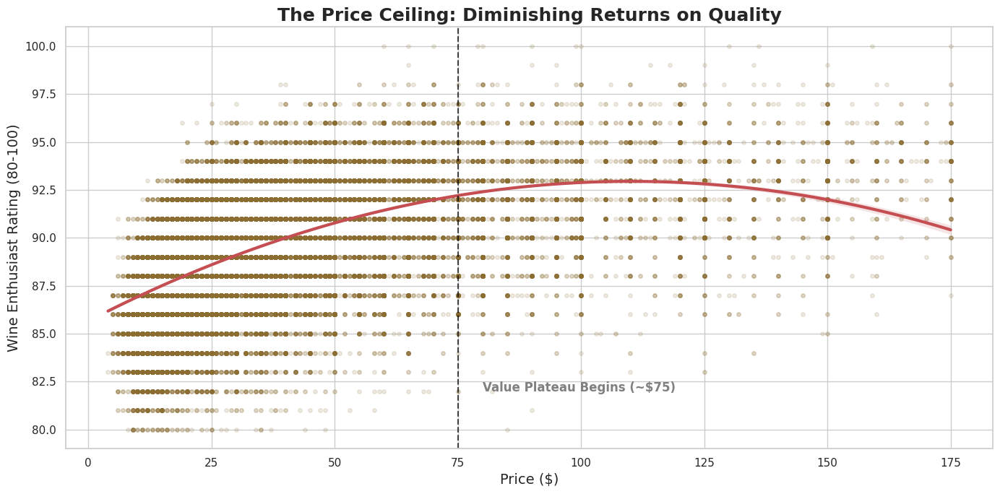

In [ ]:
# ==========================================
# VISUALIZATION 2: The Price Ceiling Plot
# ==========================================
plt.figure(figsize=(14, 7))

# Scatter plot with a 2nd-order polynomial regression line to show the curve
sns.regplot(
    data=df_viz,
    x='price',
    y='points',
    scatter_kws={'alpha': 0.15, 'color': '#8c6d31', 's': 15}, # High transparency (alpha) to show density
    line_kws={'color': '#c44e52', 'linewidth': 3},            # Red trendline to match your palette
    order=2
)

plt.title('The Price Ceiling: Diminishing Returns on Quality', fontsize=18, fontweight='bold')
plt.xlabel('Price ($)', fontsize=14)
plt.ylabel('Wine Enthusiast Rating (80-100)', fontsize=14)

# Adding visual markers to highlight the "Sweet Spot"
plt.axvline(x=75, color='black', linestyle='--', alpha=0.7)
plt.text(80, 82, 'Value Plateau Begins (~$75)', color='gray', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

### The Price Ceiling: Quantifying Diminishing Returns
This visualization addresses one of the most persistent questions in the wine industry: does a higher price tag always guarantee a better bottle? By plotting the relationship between cost and critical acclaim across our entire dataset and applying a polynomial regression line, we can mathematically observe the "Price Ceiling"—the point where spending more money stops resulting in a meaningfully better experience.

During the initial phase of the curve, specifically between 5 and 50, we see a relatively steep positive correlation. In this area, the market behaves logically; as a consumer invests more, the likelihood of receiving a higher-rated wine increases significantly. This is the area where production costs—such as high-quality oak barrels, hand-harvesting, and lower vineyard yields—are most directly reflected in the final point score. For the everyday shopper, this is the most rewarding part of the market to navigate, as quality gains are still tied closely to the dollar amount spent.

However, as we cross the threshold marked at &#36;75, the data reveals a clear plateau. Beyond this vertical line, the regression curve begins to flatten and eventually dip, signaling the onset of diminishing returns. While 95+ point wines certainly exist in the &#36;100 to &#36;175 range, they are no longer statistically more frequent than they are in the &#36;60 to &#36;80 range. This confirms that once a bottle crosses the &#36;75 prestige boundary, the price is often driven by factors other than raw liquid quality, such as brand heritage, regional "prestige taxes," and vineyard rarity.

The density of the scatter plot further reinforces the "Hidden Gem" hypothesis. Notice the high concentration of points scoring between 90 and 95 that are priced well below the &#36;40 mark. These are the statistical outliers our project seeks to isolate. By identifying the wines that sit vertically highest above the regression line, we can find the bottles that offer the sensory experience of a &#36;120 wine at a fraction of the cost. This plot serves as a reminder that while price and quality are related, they are not inseparable, and the "best" wine is often found long before the price reaches its peak.

In [ ]:
import plotly.express as px

# Create the 'value_tier' column based on 'True Value Index'
def assign_value_tier(tvi):
    if tvi > 1.5:
        return '🟢 Hidden Gem'
    elif tvi > 0:
        return '🔵 Great Value'
    elif tvi > -1.5:
        return '🟡 Fair Value'
    else:
        return '🔴 Overpriced / Prestige'

df_clean['value_tier'] = df_clean['True Value Index'].apply(assign_value_tier)

# 1. We create the histogram but limit the X-axis range to focus on the 'action'
fig = px.histogram(
    df_clean,
    x="True Value Index",
    color="value_tier",
    marginal="box",
    nbins=100,
    title="<b>The Value Distribution</b><br><sup>Finding high-performers across all market segments</sup>",
    labels={'True Value Index': 'Value Efficiency Score', 'value_tier': 'Category'},
    category_orders={"value_tier": ['🟢 Hidden Gem', '🔵 Great Value', '🟡 Fair Value', '🔴 Overpriced / Prestige']},
    color_discrete_map={
        '🟢 Hidden Gem': '#00CC96',
        '🔵 Great Value': '#636EFA',
        '🟡 Fair Value': '#FECB52',
        '🔴 Overpriced / Prestige': '#EF553B'
    },
    barmode='overlay',
    opacity=0.7,
    template="plotly_white",
    range_x=[-10, 5]
)

# 2. Add the Market Average line with better positioning
fig.add_vline(
    x=0,
    line_dash="dash",
    line_color="#333333",
    annotation_text="Market Average",
    annotation_position="top right"
)

# 3. Clean up the axes and legend
fig.update_layout(
    bargap=0.05,
    showlegend=True,
    xaxis=dict(tickformat=".1f"),
    yaxis_title="Number of Wines"
)

fig.show()

### The True Value Index Distribution
While our clustering analysis identified neighborhoods, this histogram represents the ultimate efficiency curve of the wine market. By plotting the True Value Index (TVI), we can see exactly how many wines live in each performance tier and identify just how rare a true bargain actually is.

The data follows a classic normal distribution centered around 0.0, which represents the Market Average. The vast majority of the 76,000 wines sit between -1.5 and +1.5. This confirms that the market is generally efficient; most wines are priced fairly for the quality they provide.

As we move to the right of the +1.5 line, the number of wines drops off sharply. These are the mathematical overachievers. They are statistically rare, representing a tiny fraction of the total market, which is why finding them usually requires expert knowledge or data analysis.

While the right side of the graph is fairly compact, the left side (Overpriced / Prestige) has a much longer tail. This visualization reveals a harsh reality of the wine world: while there is a limit to how much "extra value" a winery can offer, there is almost no limit to how much a winery can overcharge for a prestige label.

The box plots at the top of the chart provide a secondary layer of insight. Notice the long trail of red dots extending far to the left. These are extreme outliers where the price is massive compared to a mediocre score. Conversely, the Hidden Gem box plot is tight and focused, showing that "Value" is a much more specific and consistent target than "Overpriced," which can range from slightly expensive to mathematically absurd.

In [ ]:
# ==========================================
# MACHINE LEARNING: K-Means Clustering
# ==========================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import pandas as pd
import numpy as np


print("Running K-Means Clustering...")
df_viz = df_clean[df_clean['price'] <= 175]
# 1. Prepare the data (Using df_viz to focus on the sub-$175 market)
cluster_df = df_viz.copy()
cluster_df = cluster_df.dropna(subset=['price', 'points'])

# Set a baseline size of 2, and add the TVI only if it's positive
cluster_df['tvi_size'] = df_viz['True Value Index'].apply(lambda x: x + 2 if x > 0 else 2)


# We will cluster based on Price and Points
features = cluster_df[['price', 'points']]

# 2. Scale the Data (CRITICAL for K-Means)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# 3. Apply K-Means
# We choose K=4 to represent 4 distinct market segments
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_df['Cluster'] = kmeans.fit_predict(scaled_features)

# 4. Analyze the Clusters to give them Narrative Names
cluster_summary = cluster_df.groupby('Cluster').agg(
    avg_price=('price', 'mean'),
    avg_points=('points', 'mean'),
    count=('title', 'count')
).reset_index()

# Sort by price to roughly categorize them
cluster_summary = cluster_summary.sort_values(by='avg_price')

# Assign narrative names based on sorted price/points
narrative_names = {
    cluster_summary.iloc[0]['Cluster']: "🛒 Budget Staple",
    cluster_summary.iloc[1]['Cluster']: "💎 Hidden Gem:",
    cluster_summary.iloc[2]['Cluster']: "✅ Solid Choice",
    cluster_summary.iloc[3]['Cluster']: "✨ Premium Choice"
}
cluster_df['Narrative_Cluster'] = cluster_df['Cluster'].map(narrative_names)

display(cluster_summary)

# Define a color map for the clusters, ensuring keys match the narrative names exactly
cluster_mapping = {
    "🛒 Budget Staple": "#808080",  # Grey for budget
    "💎 Hidden Gem:": "#007bff",   # Green for hidden gems
    "✅ Solid Choice": "#28a745",  # Blue for solid choice
    "✨ Premium Choice": "#ffc107"  # Gold for premium choice
}

# ------------------------------------------------------------------
# 2. UPDATE THE DATAFRAME WITH EMOJI NAMES
# ------------------------------------------------------------------

# First, strip any leading/trailing spaces in case of subtle differences
cluster_df['Narrative_Cluster'] = cluster_df['Narrative_Cluster'].str.strip()

# ------------------------------------------------------------------
# 3. CREATE THE INTERACTIVE SCATTER PLOT
# ------------------------------------------------------------------
fig = px.scatter(
    cluster_df,
    x='price',
    y='points',
    color='Narrative_Cluster',
    size = 'tvi_size',
    # CRITICAL: Use the color_discrete_map to match the new names precisely
    color_discrete_map=cluster_mapping,
    hover_data=['title', 'variety', 'country'], # Shows specific bottle info on hover
    title='<b>The Wine Tiers: K-Means Clustering of the Market</b>',
    # Update labels to match our new named clusters
    labels={'price': 'Price ($)', 'points': 'Rating Score', 'Narrative_Cluster': 'Market Segment'},
    opacity=0.6
)

# ------------------------------------------------------------------
# 4. REFINE THE LAYOUT
# ------------------------------------------------------------------
fig.update_layout(
    template="plotly_white",
    legend_title="<b>Market Segments</b>",
    # Using 'dict' forces the legend to respect the exact string order we mapped
    # but Plotly usually sorts them alphabetically.
    # To force a logical order (Budget -> Hidden -> Premium -> Luxury), use categoryarray:
    xaxis=dict(title='Price ($)', tickprefix='$'),
    yaxis=dict(title='Wine Enthusiast Rating (80-100)'),
    font=dict(family="Arial", size=12)
)

# Optional: Force the legend order logically (from budget to luxury)
fig.update_layout(
    legend_traceorder="normal" # "normal" will sort based on appearance in dataframe, but alphabetical is cleaner for emojis.
)

# ------------------------------------------------------------------
# 5. SHOW AND SAVE
# ------------------------------------------------------------------
fig.show() # Displays the interactive plot in your notebook
fig.write_html("wine_tribes_clusters_emojis.html", include_plotlyjs='cdn')

# ------------------------------------------------------------------
# 6. PRINT THE HIDDEN GEMS SUMMARY (Update filter)
# ------------------------------------------------------------------
print("\n--- A few examples from '💎 Hidden Gem:' cluster ---")
# Adjust the string filter if your cluster name is slightly different
hidden_gems = cluster_df[cluster_df['Narrative_Cluster'].str.contains("Hidden Gem:", case=False)]
display(hidden_gems[['title', 'variety', 'country', 'price', 'points']].head(3))

Running K-Means Clustering...


,Cluster,avg_price,avg_points,count
1,1,20.371541,85.730624,19586
2,2,26.294813,89.156789,30270
0,0,47.155576,92.081861,19521
3,3,99.562609,92.242501,6301



--- A few examples from '💎 Hidden Gem:' cluster ---


,title,variety,country,price,points
19,Château des Mille Anges 2015 Cadillac Côtes de Bordeaux,Bordeaux-style Red Blend,France,24.0,88
20,Cortes de Cima 2013 Red (Alentejano),Portuguese Red,Portugal,22.0,88
21,Crux 2013 G-S-M (Russian River Valley),G-S-M,US,42.0,88



### K-Means Clustering to Analyze Market Segments
While the True Value Index provides a linear ranking of efficiency, we wanted to see how the market naturally organizes itself. To do this, we employed K-Means Clustering, an unsupervised machine learning algorithm. By grouping wines based on their Price and Points, we can identify where different types of consumers usually spend their time.
K-Means relies on calculating the Euclidean distance between points. Because our points are between 80–100 and our prices are between &#36;4–&#36;175, the raw numbers would confuse the model—a &#36;1 change in price would be treated with the same weight as a 1-point change in quality.To fix this, we used StandardScaler to transform both features into $Z$-scores. This ensures the model treats a "standard deviation of quality" and a "standard deviation of price" with equal importance.

By setting $K=4$, the algorithm successfully isolated four distinct archetypes on the shelf:
* 🛒 Budget Staple (Grey): These are the high-volume, reliable entry points. They sit at the bottom-left of the chart, offering accessibility but generally capping out in quality around 86–87 points.
* 💎 Hidden Gem (Blue): This is our sweet spot. These wines stay relatively inexpensive (mostly under &#36;40) but jump vertically in quality. This cluster contains the highest density of large dots, indicating exceptional True Value Index scores.
* ✅ Solid Choice (Green): This represents the mid-to-high tier market. Here, you are paying more, but you are almost guaranteed a "90+ point" experience. It’s the reliable zone for enthusiasts who want quality without entering the luxury price bracket.
* ✨ Premium Choice (Gold): This cluster captures the "Prestige Tax" in action. Notice how this group stretches far to the right. As price increases toward 175, the point scores don't necessarily follow. This group illustrates diminishing returns: once you cross the 80 threshold, you are often paying for rarity, branding, or cellar potential rather than immediate flavor quality.

To bridge our machine learning clusters with our value analysis, we mapped the True Value Index to the size of the markers. Even within the "Premium Choice" or "Budget Staple" groups, the varying sizes tell a story. A large dot in the Premium cluster indicates a luxury bottle that actually justifies its high price, whereas a tiny dot in the Hidden Gem cluster suggests a wine that barely made the cut. This visualization allows us to see not just which group a wine belongs to, but how well it performs within that group.

The K-Means model proves that "Value" isn't a single point on a map; it exists in every category. However, the Blue and Green neighborhoods represent the most efficient areas of the market for consumers looking to maximize their budget.

In [ ]:
import plotly.express as px

value_wines = df_clean.copy()

# 2. Aggregate to get counts and average value per province
treemap_data = value_wines.groupby(['country', 'province']).agg({
    'True Value Index': 'mean',
    'title': 'count'
}).reset_index()

# 3. Filter for significance (only show regions with more than 10 bargain wines)
treemap_data = treemap_data[treemap_data['title'] >= 10]

# 4. Create the Treemap
fig = px.treemap(
    treemap_data,
    path=[px.Constant("Global Value Market"), 'country', 'province'],
    values='title',                # Size is based on how many wines exist
    color='True Value Index',      # Color is based on the intensity of the value
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint=0,
    title="<b>The Volume of Value</b><br><sup>Box Size = Number of Wines | Color = Value Intensity</sup>"
)

# 5. Clean UI to match your professional aesthetic
fig.update_layout(
    margin=dict(t=50, l=10, r=10, b=10),
    font=dict(family="Arial", size=14)
)

# This makes the labels much cleaner
fig.update_traces(textinfo="label+value", selector=dict(type='treemap'))

fig.write_html("value_volume_treemap.html")
fig.show()
import plotly.express as px

# 1. Prepare the data
value_wines = df_clean.copy()

# 2. Apply the "Weighted" scaling
# We subtract 80 because scores in this dataset typically start at 80.
# This makes a 95-point wine (15 units) look 3x larger than an 85-point wine (5 units).
value_wines['weighted_points'] = value_wines['points'] - 80

# 3. Aggregate for the Treemap
treemap_weighted = value_wines.groupby(['country', 'province']).agg({
    'points': 'mean',
    'weighted_points': 'mean',
    'True Value Index': 'mean',
    'title': 'count'
}).reset_index()

# 4. Filter for significance
treemap_weighted = treemap_weighted[treemap_weighted['title'] >= 10]

# 5. Create the Visualization
fig = px.treemap(
    treemap_weighted,
    path=[px.Constant("Global Quality-Value Matrix"), 'country', 'province'],
    values='weighted_points',      # SIZE is now the Weighted Score
    color='True Value Index',      # COLOR remains Value Intensity
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint=0,
    range_color=[-2, 2],
    title="<b>The Quality Titans</b><br><sup>Box Size = Quality (Weighted Points) | Color = Value Index</sup>"
)

# 6. UI Polish
fig.update_layout(
    margin=dict(t=80, l=10, r=10, b=10),
    template="plotly_white"
)

# Update hover to show the REAL score, not the weighted one
fig.update_traces(
    textinfo="label",
    hovertemplate='<b>%{label}</b><br>Avg Score: %{customdata[0]:.1f}<br>Value Index: %{color:.2f}',
    customdata=treemap_weighted[['points']]
)

fig.write_html("weighted_quality_treemap.html")
fig.show()

### Geospatial Analysis: Mapping the Global Market
After establishing the True Value Index (TVI) at a bottle level, the next logical step in our analysis is to investigate the geographical origins of these "Hidden Gems." By utilizing hierarchical treemaps, we can move beyond individual recommendations and begin to map the global wine market as a cohesive landscape. This geospatial approach allows us to observe how different countries and provinces perform relative to one another, providing a high-level view of where market efficiency is most—and least—prevalent.

The first iteration of our geospatial analysis focuses on market presence through the "Volume of Value" treemap. In this visualization, the size of each box is determined by the total count of reviews within our dataset. It is important to note that the dominance of the United States (specifically California) in this view is not necessarily a reflection of total global production, but rather a result of sampling bias inherent in the dataset. This means that California occupies the majority of our data. However, despite this high volume of reviews, California's color remains a neutral yellow, signaling that it sits precisely at the global average for value. By using the True Value Index as our color scale, we can look past this volume bias to identify which producers—regardless of how often they are reviewed—are over-performing (green) or under-performing (red) relative to the global mean.

To maintain the statistical integrity of our regional findings, we implemented a significance filter that requires a region to have at least ten reviews before it is displayed. This is a critical step in our data cleaning process because it prevents "one-hit wonders"—isolated, exceptionally high-scoring bottles—from falsely characterizing an entire province as a value destination. By ensuring we only visualize established regional patterns, we provide a more reliable roadmap for consumers who are looking for consistent quality from specific areas like the Douro in Portugal or the Mosel in Germany.

We pivot from "Market Volume" to "Quality Intensity." In the "Quality Titans" view, we implement a weighted scoring system to redefine the size of the boxes. Since the Wine Enthusiast rating scale effectively operates within a narrow window of 80 to 100 points, we calculate the size using the formula (Points - 80). This transformation is essential for visual perception; it ensures that a 95-point wine, which is 15 units above the baseline, appears three times larger than an 85-point wine, which is only 5 units above. This mathematical adjustment allows the map to prioritize excellence over quantity, effectively highlighting regions that produce superior wine regardless of their total representation in the dataset.

When this weighted quality filter is applied, the global map undergoes a dramatic transformation. Traditional giants like the United States and Italy shrink, making room for "Value Titans" like Austria, Portugal, and Chile to dominate the visualization. Austria, in particular, emerges as a major protagonist in this view, showing deep green intensity across nearly all of its sub-regions. This demonstrates that while Austria may not have the same volume of reviews as California, it offers a much higher "density of quality," meaning a consumer has a statistically higher chance of finding a high-performing bottle when shopping in that section of the store.


In [ ]:
import pandas as pd
import plotly.express as px

# 1. Define Flavor "Families" and their keywords
flavor_map = {
    'Oaky/Toasty': ['oak', 'vanilla', 'toast', 'butter', 'cedar', 'smoke'],
    'Dark Fruit': ['blackberry', 'plum', 'cherry', 'currant', 'dark fruit'],
    'Citrus/Acidic': ['lemon', 'lime', 'grapefruit', 'acid', 'zest', 'citrus'],
    'Earthy/Savory': ['earth', 'mushroom', 'leather', 'tobacco', 'herb', 'savory'],
    'Tropical/Sweet': ['pineapple', 'mango', 'honey', 'peach', 'sweet', 'tropical']
}

# 2. Extract Flavors from the Description
# We create a column for each flavor family (True/False if keyword is present)
for flavor, keywords in flavor_map.items():
    df_clean[flavor] = df_clean['description'].str.lower().str.contains('|'.join(keywords))

# 3. Prepare data for the Matrix
# We look at the Top 15 varieties to keep the chart readable
top_varieties = df_clean['variety'].value_counts().nlargest(25).index
matrix_df = df_clean[df_clean['variety'].isin(top_varieties)]

# Melt the dataframe so each wine/flavor combination is a row
melted_df = matrix_df.melt(
    id_vars=['variety', 'True Value Index'],
    value_vars=list(flavor_map.keys()),
    var_name='Flavor_Family',
    value_name='Has_Flavor'
)

# Only keep rows where the flavor was actually present
melted_df = melted_df[melted_df['Has_Flavor'] == True]
# 4. Aggregate and Pivot (Swapping axes for Landscape)
heatmap_data = melted_df.groupby(['variety', 'Flavor_Family'])['True Value Index'].mean().reset_index()

# Note: We now put Flavor_Family on the INDEX and Variety on the COLUMNS
pivot_table = heatmap_data.pivot(index='Flavor_Family', columns='variety', values='True Value Index')

# 5. Visualize the Landscape Fingerprint
fig = px.imshow(
    pivot_table,
    labels=dict(x="Grape Variety", y="Flavor Profile", color="True Value Index"),
    x=pivot_table.columns,
    y=pivot_table.index,
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint=0,
    # Adjust aspect to 'auto' to ensure it fills the landscape width
    aspect="auto",
    title="<b>The Flavor Fingerprint</b><br><sup>Compare 25 Varieties across Flavor Profiles</sup>"
)

fig.update_layout(
    xaxis_title=None,
    yaxis_title=None,
    template="plotly_white",
    # Set a specific height and width ratio for landscape
    height=500,
    margin=dict(l=10, r=10, b=100, t=80), # Increased bottom margin for rotated labels
)

# Rotate the grape names so they are readable
fig.update_xaxes(tickangle=45)

fig.write_html("flavor_value_matrix_landscape.html")
fig.show()

### Mapping Value to Palate: Decoding the Sommelier’s Vocabulary

Once we have mapped the market regions and established where value is most plentiful, we must address the most subjective part of the wine experience: the taste. To bridge the gap between statistical efficiency and the physical palate, we utilized Rule-Based Natural Language Processing (NLP) to perform keyword extraction on over 76,000 expert descriptions. By identifying recurring sensory markers, we were able to distill thousands of unique, qualitative reviews into five distinct Flavor Families.

#### Process
To start, we defined five flavor types—Oaky/Toasty, Dark Fruit, Citrus/Acidic, Earthy/Savory, and Tropical/Sweet—using a dictionary of professional descriptors (e.g., "cedar" and "smoke" for Oaky; "leather" and "tobacco" for Earthy). This was done with the help of an LLM. Then, we scanned every review description. If a review mentioned any keyword from a family, it was tagged with a boolean True. This effectively turned a block of text into five binary features.

Because a single bottle can be both "Citrusy" and "Oaky," we used the melt function to transition the data from a wide format to a long format. This allowed each wine-to-flavor relationship to be treated as an individual observation. If we kept the data in its wide format, we would have to choose which flavor to count, or create complex "Multi-Flavor" combinations that would make our heatmap unreadable.

To maintain high signal-to-noise ratios, we focused on the Top 25 grape varieties by volume. We then calculated the mean True Value Index (TVI) for every variety-flavor combination.

Finally, we pivoted this data into a landscape matrix, where the color intensity represents the average value efficiency for that specific flavor profile.

#### Analysis

The resulting landscape matrix reveals that value is not just a function of geography, but of stylistic identity. When we examine the heatmap, several stark patterns emerge that redefine our understanding of market efficiency:

* The Value Titans: Grapes like Grüner Veltliner and Gamay glow deep green across almost every flavor profile. This suggests these varieties are "Safe Bets"; whether the specific bottle is citrus-heavy or earthy, it is mathematically likely to provide more quality than its price tag suggests.

* The Prestige Tax: In contrast, high-prestige varieties like Cabernet Sauvignon and Champagne Blends show significant "Red Zones," particularly in the Earthy/Savory and Oaky/Toasty categories. This indicates a high prestige markup—consumers are often paying for the cultural status of the grape rather than a statistically superior sensory experience.

This heatmap introduces a powerful strategy for the consumer. If a user enjoys a specific "Flavor Fingerprint"—for example, an Earthy/Savory profile—they can see that buying an expensive Cabernet Sauvignon (Deep Red) is an inefficient choice. The data suggests they can find the exact same structural characteristics with a significantly higher Value Index by "swapping" to a Rhône-style Red Blend or a Portuguese Red (Green).

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# 1. Initialize and Fit TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=5000)
tfidf_matrix = tfidf_vectorizer.fit_transform(df_clean['description'].fillna(''))

import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import cosine_similarity

def get_concierge_recommendation(user_text, max_price=50):
    """
    The core NLP engine: Matches user intent to wine descriptions
    and filters for the best statistical value.
    """
    # 1. Vectorize user input
    user_vec = tfidf_vectorizer.transform([user_text])
    cosine_sim = cosine_similarity(user_vec, tfidf_matrix).flatten()

    sim_scores_df = df_clean.copy()
    sim_scores_df['similarity_score'] = cosine_sim

    # 2. Filter by budget
    affordable = sim_scores_df[sim_scores_df['price'] <= max_price]
    if affordable.empty:
        return pd.DataFrame()

    # 3. Select top 15 matches, then re-rank by TVI to find the 'Winners'
    top_matches = affordable.nlargest(15, 'similarity_score')
    winners = top_matches.sort_values(by='True Value Index', ascending=False).head(3).copy()

    # 4. Scale metrics for the Radar Plot
    max_sim = top_matches['similarity_score'].max()
    winners['flavor_match_normalized'] = winners['similarity_score'] / max_sim if max_sim > 0 else 0

    scaler = MinMaxScaler()
    winners['tvi_scaled'] = scaler.fit_transform(winners[['True Value Index']])
    winners['points_scaled'] = scaler.fit_transform(winners[['points']])

    winners['price_efficiency'] = 1 - (winners['price'] / max_price)
    winners['popularity_scaled'] = winners['similarity_score'] / winners['similarity_score'].max()

    return winners

def plot_sommelier_results(top_wines):
    categories = ['Value Index', 'Review Score', 'Price Efficiency', 'Flavor Match', 'Relative Popularity']
    # Wine-themed colors for the radar chart (Burgundy, Gold, Rose)
    colors = ['#600000', '#D4AF37', '#C08081']

    fig = go.Figure()

    for count, (i, row) in enumerate(top_wines.iterrows()):
        color = colors[count % len(colors)]
        fig.add_trace(go.Scatterpolar(
            r=[row['tvi_scaled'], row['points_scaled'], row['price_efficiency'],
               row['flavor_match_normalized'], row['popularity_scaled']],
            theta=categories,
            fill='toself',
            name=row['title'][:30] + "...",
            line=dict(color=color, width=3),
            fillcolor=color,
            marker=dict(color=color),
            opacity=0.7
        ))

    fig.update_layout(
      polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
      showlegend=True,
      title="<b>Why the AI Picked These</b><br><sup>Comparing flavor match and statistical value</sup>",
      margin=dict(t=80, b=40, l=40, r=40)
    )
    return fig

import joblib
import scipy.sparse

# For the Streamlit site:
columns_to_keep = ['title', 'variety', 'price', 'points', 'True Value Index', 'description']
df_clean[columns_to_keep].to_parquet("sommelier_data.parquet", index=False)
joblib.dump(tfidf_vectorizer, "tfidf_vectorizer.joblib")
scipy.sparse.save_npz("tfidf_matrix.npz", tfidf_matrix)


### The AI Sommelier

While the Flavor Fingerprint gave us a high-level map of the market, the final goal of this project is to provide personalized, real-time advice. To do this, we built a recommendation engine that doesn't just look at categories, but actually "reads" wine reviews to find the perfect match for a user's specific craving.

#### How the NLP Engine "Reads"
To turn human language into a mathematical search, we utilize a two-step NLP pipeline:

* Step 1: We use TF-IDF (Term Frequency-Inverse Document Frequency) to transform 76,000 descriptions into a numerical matrix. Unlike a simple keyword search, TF-IDF is "smart". It down-weights common filler words (like "wine," "palate," or "tastes") and up-weights distinctive flavor markers (like "graphite," "lychee," or "leather").$$TF\text{-}IDF(t, d) = tf(t, d) \times \log\left(\frac{N}{df(t)}\right)$$

* Step 2: When a user types a query like "Crisp citrus for a white fish dinner," we convert that sentence into a vector. We then calculate the Cosine Similarity between the user's intent and every single wine in our database. This measures the "angular distance" between two vectors; a score of 1.0 is a perfect match, while 0.0 is completely irrelevant.$$\cos(\theta) = \frac{\mathbf{A} \cdot \mathbf{B}}{\|\mathbf{A}\| \|\mathbf{B}\|}$$

Most search engines stop at the match. Our Sommelier adds a secondary layer of intelligence. It finds the top 15 matches for your flavor profile. It then re-ranks those matches based on the True Value Index. This ensures that the *AI Sommelier* doesn't just find a wine that matches your dinner, but it also finds the one that is the best statistical bargain in the room. Here is the engine in action, searching for a budget-friendly ($<$ $20) match for a summer seafood pairing:

In [ ]:
import pandas as pd

# Set max column width to 'None' (unlimited)
pd.set_option('display.max_colwidth', None)

# Testing the engine with a specific user intent
recommendation = get_concierge_recommendation(
    user_text="Crisp citrus, lemon, green apple, perfect for white fish and summer",
    max_price=20
)

# Viewing the top 3 results
print("AI Sommelier Recommendations:")
display(recommendation[['title', 'price', 'points', 'True Value Index', 'flavor_match_normalized', 'description']])

plot_sommelier_results(recommendation)

AI Sommelier Recommendations:


,title,price,points,True Value Index,flavor_match_normalized,description
15502,Terra d'Oro 2015 Chenin Blanc-Viognier White (Clarksburg),16.0,90,0.711069,0.779444,"This is an elegant, intricate wine that's fresh and lively while layered with attractive green apple, white pepper and thyme flavors. Light bodied, it makes a great apéritif or pairing with fish and fowl."
39308,Adolf & Heinrich Fuchs 2018 Welschriesling (Steiermark),10.0,89,0.490123,0.747070,"Fern fronds and green pear make for a refreshing nose that promises freshness. The palate adds zingy citrus on a light body with a clean dry finish. It's a perfect, light, summer wine."
12060,Luis Duarte 2016 Rapariga da Quinta Colheita Seleccionada Rosé (Alentejano),16.0,88,0.020103,0.913500,"Made from the Moreto grape, this light and fruity wine is a perfect summer rosé. It is crisp with red currant and raspberry fruits, with a delicious layer of acidity. Drink now."


 ### Visualizing the Sommelier Recommendation

The final output of the AI Sommelier is summarized in a Radar Profile (also known as a Spider Chart). While a standard table provides raw data, the radar chart visualizes the "personality" of each recommendation. In data science, this is a powerful way to represent multivariate trade-offs—allowing us to see at a glance why the AI prioritized one bottle over another, even if their final scores were similar.

Each recommendation is evaluated across five normalized dimensions, scaled from 0.0 to 1.0:

* Flavor Match: This represents the semantic accuracy. It is the strength of the NLP-driven similarity between your specific query and the sommelier's professional review.

* Value Index (TVI): The core heartbeat of our project. This axis shows how much the wine’s quality mathematically exceeds its market price.

* Review Score: The normalized expert point system. This tells you if the wine is "good" in a vacuum, regardless of price.

* Price Efficiency: A measure of "savings." A score near 1.0 means the wine is significantly below your maximum budget while maintaining high quality.

* Relative Popularity: This measures match confidence. It compares how strong your top matches are relative to the entire searchable database.

#### Interpreting the Shapes: The Story of Three Wines
Looking at the figure above, we can see the AI navigating three distinct strategies to satisfy the user's request:

* The Value Titan (Terra d'Oro - Burgundy): Notice how this shape is heavily skewed toward the Value Index and Review Score. The AI is signaling that this is a "powerhouse" pick. It may not be the exact semantic match for every single keyword in your query, but its statistical efficiency is so high that the AI considers it a "must-buy."

* The Precise Pairing (Luis Duarte - Rose): This wine stretches furthest toward the Flavor Match and Relative Popularity axes. This is the "Semantic Winner." The AI picked this because the sommelier's description contains the exact flavor profile you asked for, making it the most accurate sensory match in the cellar.

* The Balanced Choice (Adolf & Heinrich Fuchs - Gold): This wine presents a more equilateral, well-rounded shape. It doesn't "peak" in any one category but offers a solid compromise between price, quality, and taste.

## Genre
The project follows the Martini Glass genre. Where the first four section would be the "stem," as they are author-driven and are strictly linear. The goal is to lead the user through an analytical path to explain how the data was processed and why the different metrics matter.

The bowl is then once the user reaches* The AI Sommelier, and the narrative opens up. The user is no longer just a spectator, they can take the control to input their own dinner plans and budgetm exploring the data according to their personal needs.

####Visual Narrative


##### Category 1: Visual Structuring
* Consistent Visual Platform: By using a single Streamlit page with a unified wine-themed color palette (Burgundy and Gold), we ensure the user doesn't feel like they are jumping between different websites. The layout stays stable as they scroll, providing a "safe" environment to explore complex data.
* Establishing Shot: The opening section with the large title and the "Illusion of Price" scatter plot acts as our "Establishing Shot." It sets the scene, defines the problem, and tells the user exactly what the "world" of this data story is about before they dive into the details.

##### Category 2: Highlighting
* Close-Ups (Details-on-Demand): Every time a user hovers over a data point to see the bottle title, variety, or description, we are providing a "Close-Up." We keep the high-level view clean, but allow the user to "zoom in" on the specific details of a single wine. Futhermore, in The Landscape section utilizes interactive comparison to further facilitate the Details-on-Deman. By allowing the user to switch between a volume-based view and a quality-weighted view, we create an "aha!" moment where the hidden efficiency of the market becomes visible. This geospatial transition serves as the final bridge in our data story: it moves the user from a general understanding of the world map to the specific flavor-based and meal-based tools they will use to find their perfect bottle.

##### Category 3: Transition Guidance

* Animated Transitions: Since we are using Plotly, the charts have built-in animated transitions. When a user switches a view, the data points slide or resize smoothly rather than flickering. This motion guides the eye to the new state of the data, maintaining the "narrative flow."


#### Narrative Structure

##### Category 1: Ordering
* Linear: The user must understand "Price vs. Points" (Section 1) before they can appreciate the "True Value Index" (Section 2). This linear path builds the necessary "vocabulary" for the story.
* User Directed Path: While the first 80% of the story is linear, the AI Sommelier at the end creates a user-directed experience. The user chooses their own "ending" by inputting their specific dinner plans, effectively turning the linear stem into an open-ended exploration.

##### Category 2: Interactivity
* Hover Highlighting / Details: This is used in every single chart. It allows the user to keep the narrative uncluttered while providing "details-on-demand" for users who want to know the specific name of a $12 Hidden Gem.
* Filtering / Selection / Search: We use this extensively in the AI Sommelier (food text input, budget sliders, and flavor multiselect) and the Treemap toggle.
* Explicit Instruction: We help the user by giving clear directions, such as "Hit the button above to redraw the map" or "Double-click the descriptions to see full tasting notes." This ensures the user doesn't get "stuck" in the interface.

##### Category 3: Messaging

* Messaging: The narrative is driven by Introductory Text and Captions that frame the data as a "hunt for value." The final Radar Chart serves as a Summary/Synthesis tool, translating complex multivariate results into an intuitive decision matrix for the user.

## Visualizations

Every visualization in this project was chosen not just for its aesthetic value, but for its ability to reduce cognitive load and facilitate a specific "Aha!" moment in the narrative. Below is the justification for our five core visual tools.

1. The Price Ceiling (Scatter Plot + Polynomial Regression):

    To start the story, we needed to establish the "conflict": the market is inefficient. A scatter plot is the most honest way to show the raw relationship between Price and Points. By adding a polynomial regression line, we move from a chaotic "cloud" of data to a clear mathematical trend. It allows the viewer to see the "elbow" of the curve where diminishing returns begin (~&#36;75), creating a visual "Price Ceiling" that justifies our search for value.

2. Market DNA (K-Means Clustering):

    Once we know the market is inefficient, we need to categorize it. Standard filters (like "Price < &#36;20") are arbitrary. K-Means Clustering is an unsupervised learning tool that allows the data to "speak for itself." By coloring the points based on these AI-identified neighborhoods, we transform a simple chart into a Market Map. It lets us define exactly what a "Hidden Gem" is (high vertical position, low horizontal position) using a logic that is reproducible and statistically sound.

3. The Landscape (Interactive Treemaps):

    Geography is hierarchical (Country > Province > Region). Treemaps are the gold standard for visualizing nested data. By allowing the user to toggle between Volume and Quality Intensity, we expose the Sampling Bias of the dataset. When the US "giants" shrink and the "Value Titans" (like Portugal and Austria) grow, it creates a powerful narrative shift: it proves that the best bargains are often hiding in the smallest boxes.

4. The Palette (Heatmap):

    Wine flavor is a multi-dimensional problem. A heatmap is the most effective way to compare two categorical variables (Grape Variety vs. Flavor Profile) across a continuous metric (TVI). It allows the user to perform a "Variety Swap" visually. By looking for the "Green Zones" that share the same row as a "Red Zone," the user can find a high-value alternative to an expensive favorite without sacrificing the flavor profile they enjoy.

5. The Decision Matrix (Radar Chart):

    The final step—the AI recommendation—is a "black box" to the user. A radar chart is the ultimate tool for "Details-on-Demand." It allows us to plot five distinct, non-correlated metrics (Flavor Match, TVI, Price, etc.) on a single plane. It provides the "Why" behind the choice, showing the user the specific trade-offs the AI made. This transparency builds trust in the recommendation engine by visualizing the mathematical "fingerprint" of the suggested bottle.


## Discussion

The Wine Value Explorer successfully achieved its primary goal of demystifying the relationship between price and quality, but the process of building it revealed significant hurdles and opportunities for refinement. One of the most successful outcomes of the project was the development of the True Value Index (TVI). By using Z-score normalization, we created a way to compare wines across vastly different price tiers and regions fairly. This allowed us to objectively identify "Hidden Gems" that were previously lost in a sea of marketing. Furthermore, the integration of Rule-Based NLP successfully bridged the gap between dry statistics and the sensory language of the wine world. By distilling 76,000 professional reviews into five actionable "Flavor Families," we transformed a technical dataset into a practical tool that mirrors how a consumer actually thinks about taste.

However, one of the most significant missed opportunities in this version was the absence of a truly interactive geographical map to visualize terroir. In the wine world, terroir—the unique combination of soil, climate, and topography—is the fundamental driver of quality. We initially envisioned a high-fidelity map where users could see exactly where these value pockets exist in relation to physical landmarks like rivers or mountain ranges. Such a visualization would have provided a much deeper understanding of why certain regions, like Portugal's Douro or Austria's Kremstal, are so efficient at producing quality. Seeing the "Value Titans" geographically clustered would have brought the "Landscape" section of the narrative to life, reinforcing the idea that value isn't just about price; it’s about the land itself.

The primary reason this map remains missing is that the geographical data was an absolute mess to process. Unlike standard datasets that come with clean GeoJSON files or clear administrative boundaries, our source data contained inconsistent location strings that varied from specific vineyard names to broad regional classifications. Attempting to reconcile these strings with a standardized GIS format proved incredibly difficult. We spent a significant amount of time attempting to map these locations by coordinates (latitude and longitude) using geocoding APIs, but the results were inconsistent and required manual cleaning for thousands of entries. Ultimately, the process became so time-consuming, leading us to pivot to Treemaps as a more efficient way to show hierarchy.

Beyond the technical hurdles of geocoding, we must address the inherent sampling bias within our dataset. While 76,000 reviews provide a substantial statistical foundation, the distribution of these reviews is heavily skewed toward the American market. Roughly 45% of our entries are US-based wines, a reflection of the source publication’s primary audience rather than a reflection of global production. In the real world, Italy, France, and Spain are the "Big Three" of wine production, yet in our data, they often have fewer reviews combined than California alone. This creates a filtered reality where the "True Value Index" is calculated through a US-tinted lens, potentially overlooking thousands of high-value bottles from European and Southern Hemisphere producers simply because they haven't crossed the desk of a US-based critic.

To truly perfect the Wine Value Explorer, there is a dire need for a more balanced dataset that matches the review count to the actual global production volume. Currently, our "Value Titans" like Portugal and Austria appear as elite outliers because they are represented by a smaller, more curated selection of imported bottles. If we were to ingest an equal number of reviews for every major producer—matching Italy’s 18% of global production with 18% of our dataset—we might discover that the "Prestige Tax" isn't just a French or American phenomenon, but a universal trait of established regions. A truly global model would require scraping data from international critics across Europe and South America to ensure that a boutique winery in the Douro Valley is being compared against its peers with the same statistical weight as a massive estate in Napa.

This lack of data parity means that our current model is an excellent guide for the US consumer, but it isn't yet a perfect global map. Moving forward, the goal would be to move beyond a single-source dataset and aggregate scores from multiple international publications. By balancing the "Big Three" producers with our high-volume US data, we could eliminate the "survivor bias" that often makes imported wines look like better values than they are (since only the best usually get exported and reviewed). Only then can we say with absolute certainty that we’ve uncovered the true, unbiased landscape of global wine value.

## Contributions

Anastasia Hansen (s214397) did everything.

### AI Declaration

I utilized Google’s Gemini as a technical collaborator for NLP keyword extraction, code debugging, and narrative drafting throughout the development of this project. While the AI served as a valuable co-pilot, all final data cleaning, statistical validation, and overarching architecture remain the sole responsibility of the author.



## References

manyregression. (2020). *Updated Wine Enthusiast Reviews*. Retrieved from Kaggle: [https://www.kaggle.com/datasets/manyregression/updated-wine-enthusiast-review](https://www.kaggle.com/datasets/manyregression/updated-wine-enthusiast-review)